In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import cv2

In [2]:
pkl_path = r'C:\Users\drorp\Desktop\University\Thesis\video-manipulation-detection\OUTPUT\drive_around_uni_MobileNet.pkl'
pkl_path = Path(pkl_path)
df = pd.read_pickle(pkl_path.as_posix())
scores_df = df[[col for col in df if not col.startswith('time_')]]
scores_df["continuous"] = scores_df["FrameID"] == 1

C:\Users\drorp\AppData\Local\Temp/ipykernel_25068/2785582776.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores_df["continuous"] = scores_df["FrameID"] == 1


In [3]:
scores_df.groupby("continuous").count()

,vehicle,ConstantMetadata,FrameID,Timestamp,MSE,Histogram,OpticalFlow
continuous,,,,,,,
False,457,457,457,457,457,457,455
True,20572,20572,20572,20572,20572,20572,20544


In [4]:
plot_df = scores_df.iloc[1:,:]
px.histogram(plot_df, x="OpticalFlow", color="continuous", log_y=True, barmode="overlay", histnorm='probability density')

In [5]:
plot_df = scores_df.iloc[1:,:]
px.histogram(plot_df, x="Histogram", color="continuous", log_y=True, barmode="overlay", histnorm='probability density')

In [6]:
px.line(scores_df, x=np.arange(len(scores_df)), y=scores_df.OpticalFlow)

In [52]:
frame_id = 935

In [53]:
scores_df.iloc[frame_id-1:frame_id+1, :]

,vehicle,ConstantMetadata,FrameID,Timestamp,MSE,Histogram,OpticalFlow,continuous
1794,0,0,1,0.021214,18.500885,0.016516,1.879039,True
1795,0,0,1,0.021228,17.862010,0.016869,1.873453,True


In [54]:
cap.set(1, frame_id-1)
ret, frame = cap.read()
# f = plt.figure(figsize=(20,10))
# plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
px.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

In [55]:
cap.set(1, frame_id)
ret, frame = cap.read()
# f = plt.figure(figsize=(20,10))
px.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

In [16]:
cv2.imwrite(filename=f'OUTPUT/drive_around_uni_MobileNet_frame_{frame_id}.png', img=frame)

True

# ROI

In [41]:
roi_json = 'INPUT/vehicle_roi_annotation.json'

In [18]:
import json

In [35]:
# credit to https://github.com/maftouni/binary_mask_from_json.git
with open(roi_json, "r") as read_file:
    data = json.load(read_file)
region_of_interest_points = np.stack((data["roi_x"], data["roi_y"]), axis=1)
mask = np.zeros((data["height"], data["width"]), dtype="uint8")
mask = cv2.drawContours(mask, [region_of_interest_points], -1, 255, -1)

In [38]:
masked = cv2.bitwise_and(frame, frame, mask=mask)

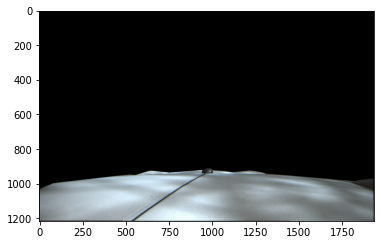

In [39]:
plt.imshow(masked)

In [43]:
import os
from pathlib import Path

In [69]:
pkl_path = r'OUTPUT\ROI_drive_around_uni_Haar.pkl'
pkl_path = Path(pkl_path)
df = pd.read_pickle(pkl_path.as_posix())
scores_df = df[[col for col in df if not col.startswith('time_')]]
scores_df["continuous"] = scores_df["FrameID"] == 1

C:\Users\drorp\AppData\Local\Temp/ipykernel_25068/2554471385.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [70]:
plot_df = scores_df.iloc[1:,:]
px.histogram(plot_df, x="RegionOfInterest",  barmode="overlay", histnorm='probability density',  color="continuous")

## Feature extraction

In [185]:
import numpy as np
import cv2
from pathlib import Path
import plotly.express as px
from manipulation_detectors.image_processing.region_of_interest_detector import binary_mask_from_json
import matplotlib.pyplot as plt

In [186]:
# video_path = Path(r'OUTPUT\drive_around_uni_masked.mp4')
video_path = Path(r'OUTPUT\drive_around_uni_MobileNet_lower_corner_quality.mp4')
roi_json = Path(r'INPUT\vehicle_roi_annotation_margin.json')

In [194]:
cap = cv2.VideoCapture(video_path.as_posix())
total_frames = cap.get(7)

first_frame_id = 0
cap.set(1, first_frame_id)
ret, query_img = cap.read()


second_frame_id = 1000
cap.set(1, second_frame_id)
ret, train_img = cap.read()

mask = binary_mask_from_json(roi_json)

In [188]:
train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)
train_img_bw = cv2.bitwise_and(train_img_bw, train_img_bw, mask=mask)
px.imshow(cv2.cvtColor(train_img_bw, cv2.COLOR_BGR2RGB))

In [189]:
# Convert it to grayscale
query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY)
train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)
   
# Initialize the ORB detector algorithm
orb = cv2.ORB_create()
   
# Now detect the keypoints and compute
# the descriptors for the query image
# and train image
queryKeypoints, queryDescriptors = orb.detectAndCompute(query_img_bw, mask)
trainKeypoints, trainDescriptors = orb.detectAndCompute(train_img_bw, mask)
  
# Initialize the Matcher for matching
# the keypoints and then match the
# keypoints
matcher = cv2.BFMatcher()
matches = matcher.match(queryDescriptors,trainDescriptors)
   
# draw the matches to the final image
# containing both the images the drawMatches()
# function takes both images and keypoints
# and outputs the matched query image with
# its train image
final_img = cv2.drawMatches(query_img, queryKeypoints, 
train_img, trainKeypoints, matches[:20],None)
   
final_img = cv2.resize(final_img, (1000,650))
  
# Show the final image
px.imshow(cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB))


In [192]:
img = train_img

img = cv2.bitwise_and(img, img, mask=mask)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# orb = cv2.ORB_create(nfeatures=2000)
# kp, des = orb.detectAndCompute(gray_img, None)

sift = cv2.SIFT_create()
kp, des = sift.detectAndCompute(query_img_bw,mask)

kp_img = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=0)

px.imshow(cv2.cvtColor(kp_img, cv2.COLOR_BGR2RGB))


## SIFT - threshold pixels distance

In [203]:
cap = cv2.VideoCapture(video_path.as_posix())
total_frames = cap.get(7)

first_frame_id = 0
cap.set(1, first_frame_id)
ret, query_img = cap.read()


second_frame_id = 1000
cap.set(1, second_frame_id)
ret, train_img = cap.read()

mask = binary_mask_from_json(roi_json)

In [209]:
query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY)
train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)
   

# Initiate SIFT detector
sift = cv2.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(query_img_bw,mask)
kp2, des2 = sift.detectAndCompute(train_img_bw,mask)
# BFMatcher with default params
print(len(kp1))
print(len(kp2))

31
34


In [211]:
query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY)
train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)
   

# Initiate SIFT detector
sift = cv2.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(query_img_bw,mask)
kp2, des2 = sift.detectAndCompute(train_img_bw,mask)
# BFMatcher with default params
bf = cv2.BFMatcher()
# matches = bf.knnMatch(des1,des2,k=2)

print(len(kp1))
print(len(kp2))
matches = bf.match(des1,des2)


dist_threshold = 10 # Distance threshold in pixels
good_matches = []
for match in matches:
    # Get keypoints for the matched descriptors
    match_kp1 = kp1[match.queryIdx]
    match_kp2 = kp2[match.trainIdx]
    # Calculate distance between keypoints
    dist = np.sqrt((match_kp1.pt[0] - match_kp2.pt[0])**2 + (match_kp1.pt[1] - match_kp2.pt[1])**2)
    if dist < dist_threshold:
        good_matches.append(match)

# cv.drawMatchesKnn expects list of lists as matches.
# img3 = cv2.drawMatches(query_img_bw,kp1,train_img_bw,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
# px.imshow(img3)

31
34


TypeError: 'cv2.KeyPoint' object is not subscriptable

## manual features

In [131]:
with open(r'C:\Users\drorp\Desktop\University\Thesis\video-manipulation-detection\INPUT\vehicl_feature_points.json', 'r') as jsonfile:
    feature_points = json.loads(jsonfile.read())
kp = [cv2.KeyPoint(x, y, 1) for x,y in zip(feature_points['feature_x'], feature_points['feature_y'])]

img = train_img

# img = cv2.bitwise_and(img, img, mask=mask)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

kp_img = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=0)

px.imshow(cv2.cvtColor(kp_img, cv2.COLOR_BGR2RGB))


In [132]:
# video_path = Path(r'OUTPUT\drive_around_uni_masked.mp4')
video_path = Path(r'OUTPUT\drive_around_uni_MobileNet_lower_corner_quality.mp4')

with open(r'C:\Users\drorp\Desktop\University\Thesis\video-manipulation-detection\INPUT\vehicl_feature_points.json', 'r') as jsonfile:
    feature_points = json.loads(jsonfile.read())
input_kp = [cv2.KeyPoint(x, y, 1) for x,y in zip(feature_points['feature_x'], feature_points['feature_y'])]

cap = cv2.VideoCapture(video_path.as_posix())
total_frames = cap.get(7)

first_frame_id = 0
cap.set(1, first_frame_id)
ret, query_img = cap.read()

second_frame_id = 1000
cap.set(1, second_frame_id)
ret, train_img = cap.read()



In [133]:
orb.compute?

Docstring:
compute(image, keypoints[, descriptors]) -> keypoints, descriptors
.   @brief Computes the descriptors for a set of keypoints detected in an image (first variant) or image set
.       (second variant).
.   
.       @param image Image.
.       @param keypoints Input collection of keypoints. Keypoints for which a descriptor cannot be
.       computed are removed. Sometimes new keypoints can be added, for example: SIFT duplicates keypoint
.       with several dominant orientations (for each orientation).
.       @param descriptors Computed descriptors. In the second variant of the method descriptors[i] are
.       descriptors computed for a keypoints[i]. Row j is the keypoints (or keypoints[i]) is the
.       descriptor for keypoint j-th keypoint.



compute(images, keypoints[, descriptors]) -> keypoints, descriptors
.   @overload
.   
.       @param images Image set.
.       @param keypoints Input collection of keypoints. Keypoints for which a descriptor cannot be
.       comp

In [136]:
[p.pt for p in queryKeypoints]

[(952.0, 916.0),
 (995.0, 916.0),
 (1002.0, 925.0),
 (942.0, 925.0),
 (1006.0, 940.0),
 (941.0, 940.0),
 (967.0, 940.0),
 (239.0, 976.0),
 (43.0, 988.0),
 (1810.0, 992.0),
 (1295.0, 945.0),
 (560.0, 950.0)]

In [ ]:
matches[0].distance

In [142]:
temp = matches[0] 

In [145]:
[temp.distance for temp in matches]

[184.72412109375,
 194.71774291992188,
 227.70814514160156,
 149.88662719726562,
 192.8756103515625,
 196.5604248046875,
 74.35724639892578,
 337.50555419921875,
 257.6334533691406,
 425.0658874511719,
 182.67184448242188,
 183.45571899414062]

In [151]:
temp.imgIdx

0

In [134]:
# Convert it to grayscale
query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY)
train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)
   
# Initialize the ORB detector algorithm
orb = cv2.ORB_create()
   
# Now detect the keypoints and compute
# the descriptors for the query image
# and train image
queryKeypoints, queryDescriptors = orb.compute(query_img_bw, input_kp)
trainKeypoints, trainDescriptors = orb.compute(train_img_bw, input_kp)
  
# Initialize the Matcher for matching
# the keypoints and then match the
# keypoints
matcher = cv2.BFMatcher()
matches = matcher.match(queryDescriptors,trainDescriptors)
   
# draw the matches to the final image
# containing both the images the drawMatches()
# function takes both images and keypoints
# and outputs the matched query image with
# its train image
final_img = cv2.drawMatches(query_img, queryKeypoints, 
train_img, trainKeypoints, matches,None)
   
final_img = cv2.resize(final_img, (1000,650))
  
# Show the final image
px.imshow(cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB))
